# Импорт библиотек

In [191]:
import matplotlib.pyplot as plt
import pygimli as pg
import pygimli.physics.traveltime as tt
from pygimli.physics.traveltime import load as loadTT
import numpy as np
import glob
import pandas as pd
import pygimli.meshtools as mt
from pygimli.viewer.mpl import drawMesh
from IPython.display import display, HTML
from util import st2sgt
import os
from exp import export_mesh_data
from cycle_of_project import finalcycle

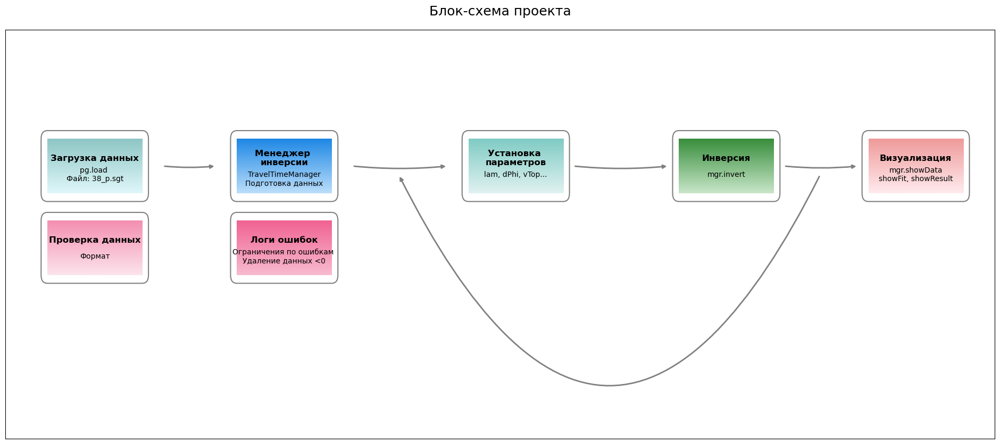

In [192]:
finalcycle()

```{note}
:class: dropdown
1. **Импорт библиотек**:
   - Используются `pyGIMLi`, `matplotlib` и `numpy` для обработки и визуализации данных.

2. **Конвертация и подгрузка данных**:
   - Конвертирует `.st` файл в `.sgt` файл с помощью функции `st2sgt.py`.
   - Структура .sgt файла:
        1. Координаты источник/приемник: информация о местоположении sensors.
        2. Порядковые номера источник/приемник и время прохождения.
        3. Ошибки измерений.
   - Загружает данные из `.sgt` файла.

3. **Создание и управление менеджером данных**:
   - Создает объект `TravelTimeManager`.
   - Оценивает ошибки и удаляет отрицательные данные.

4. **Визуализация данных и годографов**:
   - Использует функции `showData` и `drawFirstPicks` для визуализации.

5. **Инверсия данных**:
   - Выполняет инверсию данных и визуализирует результаты.
   - Повторяет процесс для улучшенной инверсии с другими параметрами.

6. **Окончательное отображение результатов и сохранение**:
   - Показывает результаты инверсии, включая стандартное покрытие и абсолютное значение RMS ошибки.
   - Сохраняет результат инверсии в папку, а затем с помощью функции `exp.py` экспортирует X Y Velocity в формате `.txt`.
```

# Загрузка данных

`Изменить путь к .st file и добавить соответсвенно путь к .sgt file`

In [120]:
# путь к .st файлу
stpath = "38_p.st"  

# путь для сохранения .sgt файла
sgtpath = "38output.sgt"  

In [121]:
if os.path.exists(stpath):
    st2sgt(stpath, sgtpath)
else:
    print(f"File {stpath} не найден.")

# Подгрузка .sgt файла
if os.path.exists(sgtpath):
    data = pg.load(sgtpath, verbose=True)
else:
    raise FileNotFoundError(f"File {sgtpath} не найден.")
print(data)

23/10/24 - 13:52:03 - pyGIMLi - INFO - Reading 38output.sgt (<function load at 0x00000251304F5C60>)


Data: Sensors: 72 data: 1008, nonzero entries: ['g', 's', 't', 'valid']


# Создание менеджера инверсии.

## Отрисовка в виде матрицы кажущихся скоростей.

23/10/24 - 13:52:05 - pyGIMLi - INFO - 212 data of 1008 not shown


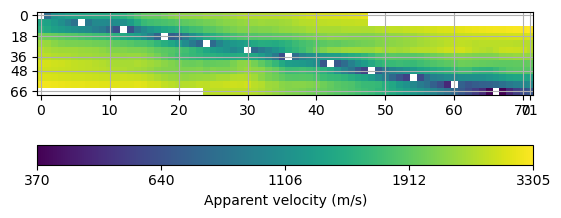

In [122]:
mgr = tt.TravelTimeManager(data)
ax, cbar = mgr.showData()

```{note}
:class: dropdown
`Learn about` [TravelTimeManager](https://www.pygimli.org/pygimliapi/_generated/pygimli.physics.traveltime.html#pygimli.physics.traveltime.TravelTimeManager)
   - Go to the [code](https://www.pygimli.org/_modules/pygimli/physics/traveltime/TravelTimeManager.html#TravelTimeManager)!
```

23/10/24 - 13:52:06 - pyGIMLi - INFO - 212 data of 1008 not shown


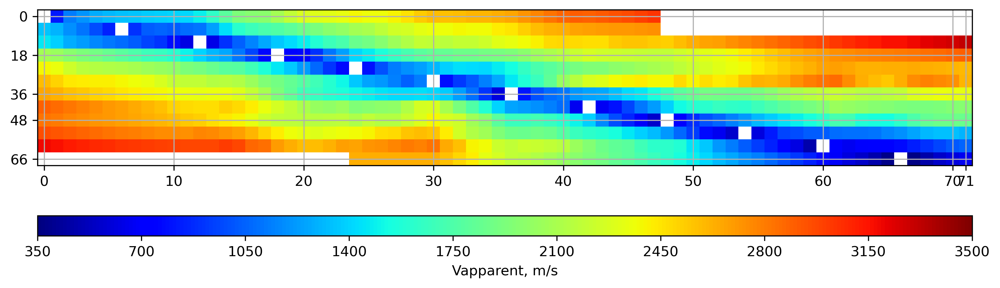

In [123]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
ax, cbar = mgr.showData(ax=ax, logScale=False, nLevs=10, cMap='jet',
                        label = r'Vapparent, m/s', savefig = False,
                        cMin=350, cMax=3500)

```{note}
:class: dropdown
- **cMin $(float [None])$** _– Минимальное значение контура. Если нет, min(data)._

- **cMax $(float [None])$** _– Максимальное значение контура. Если None max(data)._

- **nLevs $(int)$** _– Количество контурных уровней на основе cMin, cMax и logScale._

- **logScale $(bool [False])$** _– Уровни и цвета распределяются с логарифмической шкалой._

- **fitView $(bool [True])$** _– Настройка пределов оси для ограничительноки сетки._

`Learn about` [ShowData](https://www.pygimli.org/pygimliapi/_generated/pygimli.frameworks.html#pygimli.frameworks.MethodManager.showData)
   - Go to the [code](https://www.pygimli.org/_modules/pygimli/frameworks/methodManager.html#MethodManager.showData)!
```

# Ограничение по ошибкам

In [124]:
# Оценка ошибок
data['err'] = mgr.estimateError(data['t'], errLevel=0.03, absError=1e-9)

# Удаление отрицательных данных
data.remove(data['t'] < 0)

```{note}
:class: dropdown
- **data $(iterable)$** – _Значения данных, для которых должны быть оценены ошибки._

- **errLevel $(float (0.01))$** – _Уровень ошибки в процентах/100 (т.е. 3% = 0.03)._

- **absError $(float (None))$** – _Абсолютная погрешность в единице измерения данных._

`Learn about`
[estimateError](https://www.pygimli.org/pygimliapi/_generated/pygimli.frameworks.html#pygimli.frameworks.Modelling.estimateError)
   - Go to the [code](https://www.pygimli.org/_modules/pygimli/frameworks/modelling.html#Modelling.estimateError)!
```

# Отображение данных в виде годографов

## Базовая отрисовка

Text(0.5, 1.0, 'Годографы')

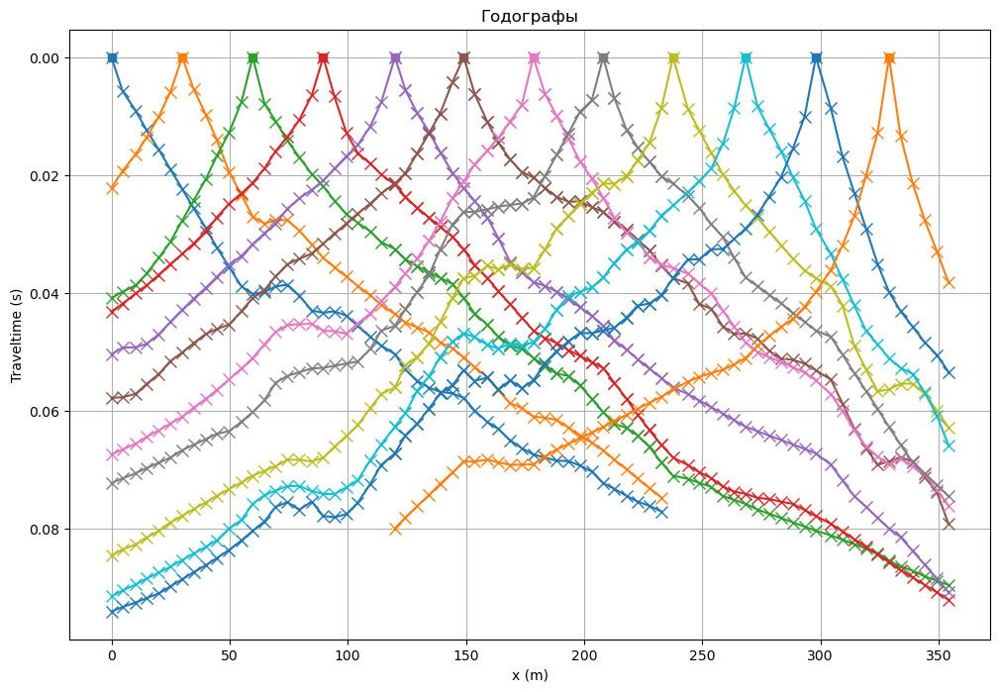

In [125]:
fig, ax = plt.subplots(figsize=(12, 8))
lines = tt.drawFirstPicks(ax, data)
plt.title("Годографы")

## Отрисовка с пользовательскими настройками 

Text(0.5, 1.0, 'Годографы')

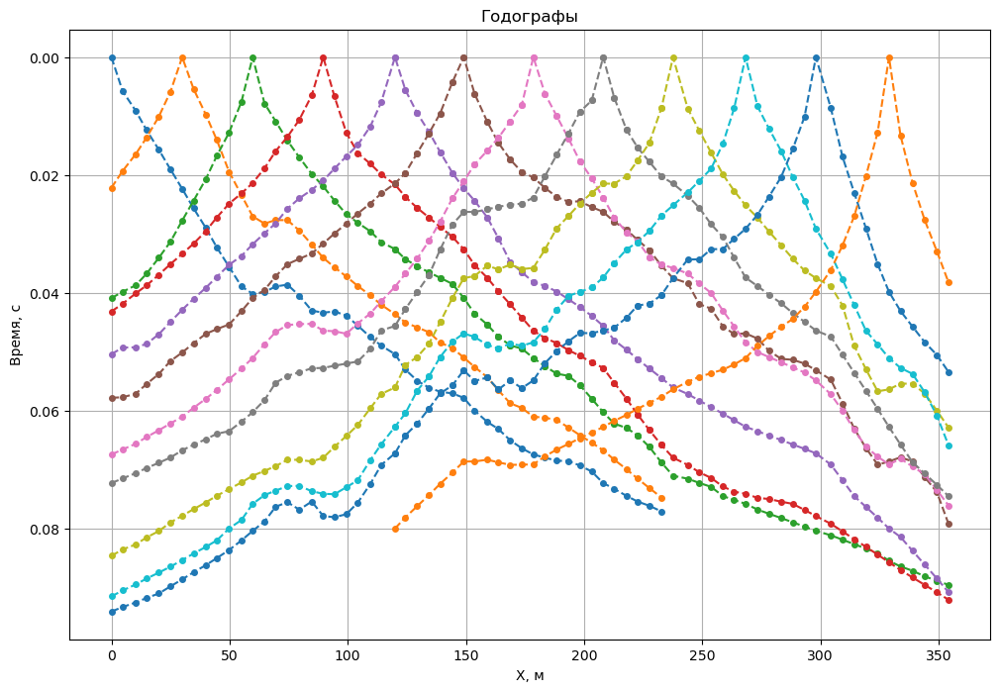

In [126]:
fig, ax = plt.subplots(figsize=(12, 8))
lines = tt.drawFirstPicks(ax, data, plotSource = False, 
                          **{'linestyle': '--', 'marker': 'o', 'markersize': '4'})

ax.set_xlabel("Х, м")
ax.set_ylabel("Время, с")

plt.title("Годографы")

# Инверсия

## Базовая инверсия

23/10/24 - 13:52:12 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 13:52:12 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 13:52:12 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/24 - 13:52:12 - pyGIMLi - INFO - Creating refined mesh (secnodes: 2) to solve forward task.
23/10/24 - 13:52:12 - pyGIMLi - INFO - Create gradient starting model. 500: 5000
23/10/24 - 13:52:12 - pyGIMLi - INFO - Created startmodel from forward operator: 1048, min/max=0.000200/0.002000


(<Axes: >, <matplotlib.colorbar.Colorbar at 0x251b316a690>)

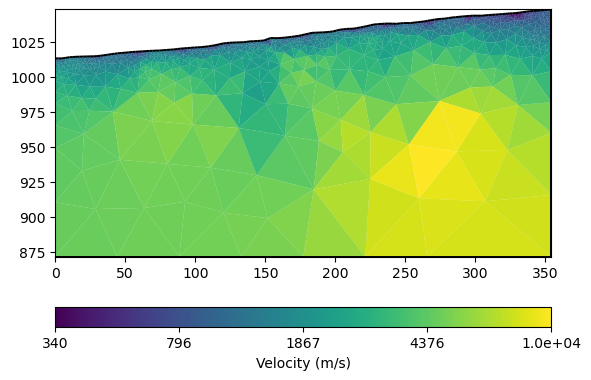

In [127]:
mgr.invert()
mgr.showResult()

### Визуализация результата базовой инверсии

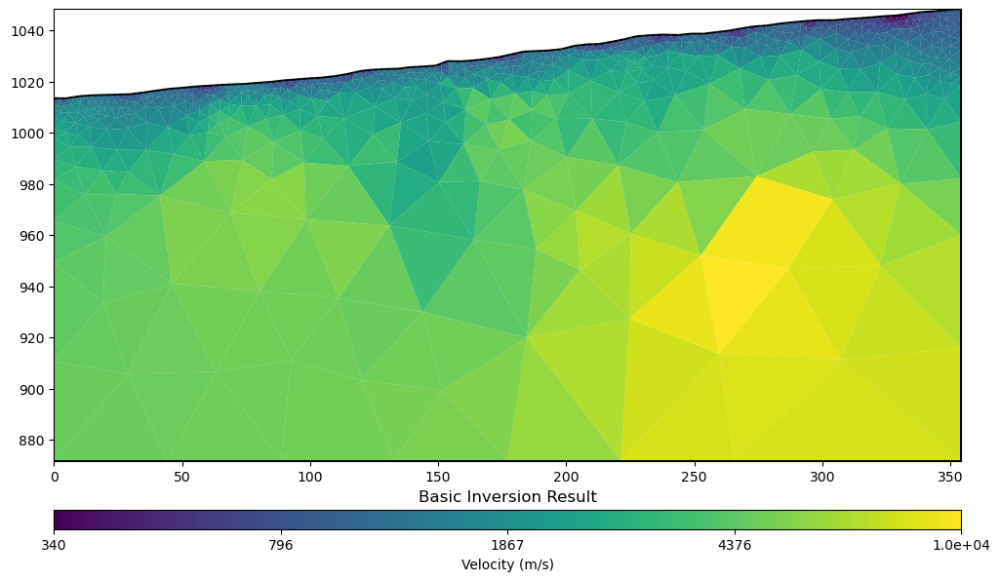

In [128]:
fig, ax = plt.subplots(figsize=(12, 8))
mgr.showResult(ax=ax)
plt.title("Basic Inversion Result")

plt.show()

## Расширенная инверсия с пользовательскими параметрами

### Процесс инверсии

In [129]:
# Обнновление менеджера
data.remove(data['t'] < 0)
mgr = tt.TravelTimeManager(data)
data['err'] = mgr.estimateError(data['t'], errLevel=0.03, absError=1e-9)


# Inversion
mgr.invert(secNodes=3, paraMaxCellSize=50.,
           zWeight=0.7, vTop=300, vBottom=7000,
           verbose=True, balanceDepth=False,
           lam=500, lambdaFactor = 0.5, dPhi = 2,
          )

# Вычисление абсолютного значения корня средней квадратичной ошибки
abs_rms = mgr.inv.absrms()
abs_rms = abs_rms * 1000

23/10/24 - 13:53:28 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 13:53:28 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 13:53:28 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/24 - 13:53:28 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
23/10/24 - 13:53:29 - pyGIMLi - INFO - Create gradient starting model. 300: 7000
23/10/24 - 13:53:29 - pyGIMLi - INFO - Created startmodel from forward operator: 2257, min/max=0.000143/0.003333
23/10/24 - 13:53:29 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.TravelTimeDijkstraModelling object at 0x00000251B15D5030>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000251B12ED530>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x000002514DECAD50>
min/max (data): 1.2e-06/0.09
min/max (error): 3%/3.08%
min/max (start model): 1.4e-04/0.0033
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2609.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  184.64 (dPhi = 92.67%) lam: 500.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   21.53 (dPhi = 86.65%) lam: 250.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   18.29 (dPhi = 19.91%) lam: 125.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   1

```{note}
:class: dropdown


- $dPhi (float)$ – Перезаписать настройки класса для критериев прерывания фи дельта-данных. По умолчанию 1%.

- $chi2 (float)$ – среднее значение квадрата несоответствия, взвешенного по ошибке.

- $maxIter (int)$ – максимальное количество итераций.

- $cType (int)$ – Временный глобальный тип ограничения для всех регионов.

- $startModel (array)$ – Временная стартовая модель для текущего прогона инверсии.

- $lam (float)$ – Временный параметр регуляризации лямбда, параметр сглаживания.

- $lambdaFactor (float)$ – Множитель для изменения lam с каждой итерацией

- $showProgress (bool)$ – Показать прогресс в виде обновления моделей

- $verbose (bool)$ – Подробный вывод на консоль

- $debug (bool)$ – Еще более подробный вывод консоли и файлов

- $paraMaxCellSize$ – максимальный размер ячеек

- $zWeight$ – вес регуляризации по глубине

- $vTop$ и $vBottom$ – скорость на границах

- $limits$ – ограничения на скорость.

`Learn about`
[invert](https://www.pygimli.org/pygimliapi/_generated/pygimli.frameworks.html#pygimli.frameworks.MeshMethodManager.invert)
   - Go to the [code](https://www.pygimli.org/_modules/pygimli/frameworks/methodManager.html#MeshMethodManager.invert)!
```


#### Отображение модельных и наблюденных годографов

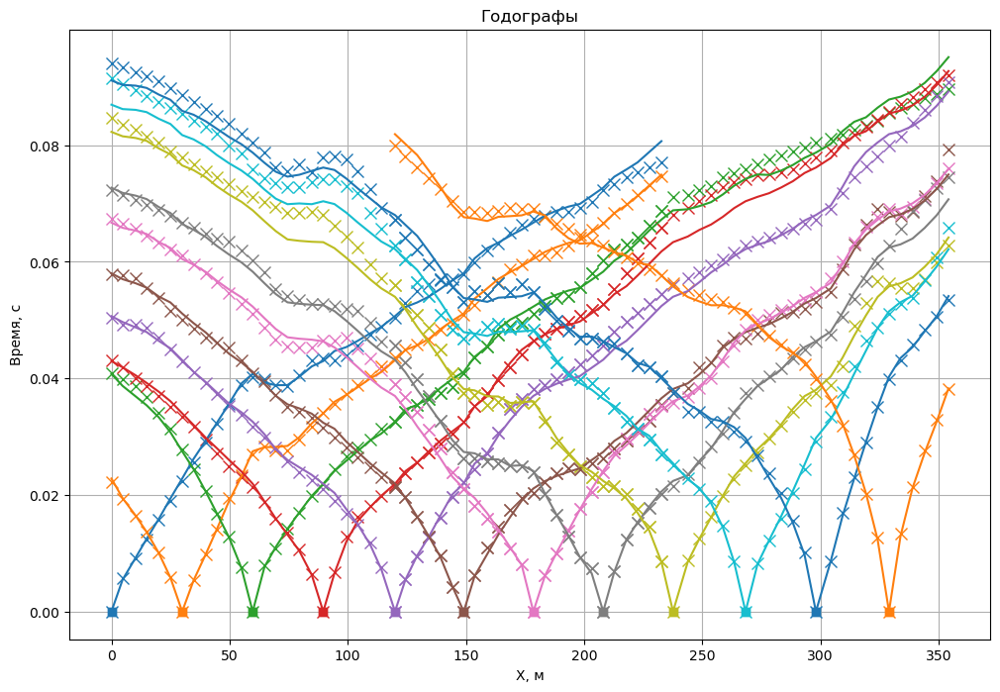

In [130]:
fig, ax = plt.subplots(figsize=(12, 8))
mgr.showFit(firstPicks=True, ax=ax)
ax.set_xlabel("Х, м")
ax.set_ylabel("Время, с")
ax.set_title("Годографы")

plt.show()

```{note}
**Наблюденные - кресты, модельные - линии.**
```

#### Отображение результата со значением RMSE и настроками параметров

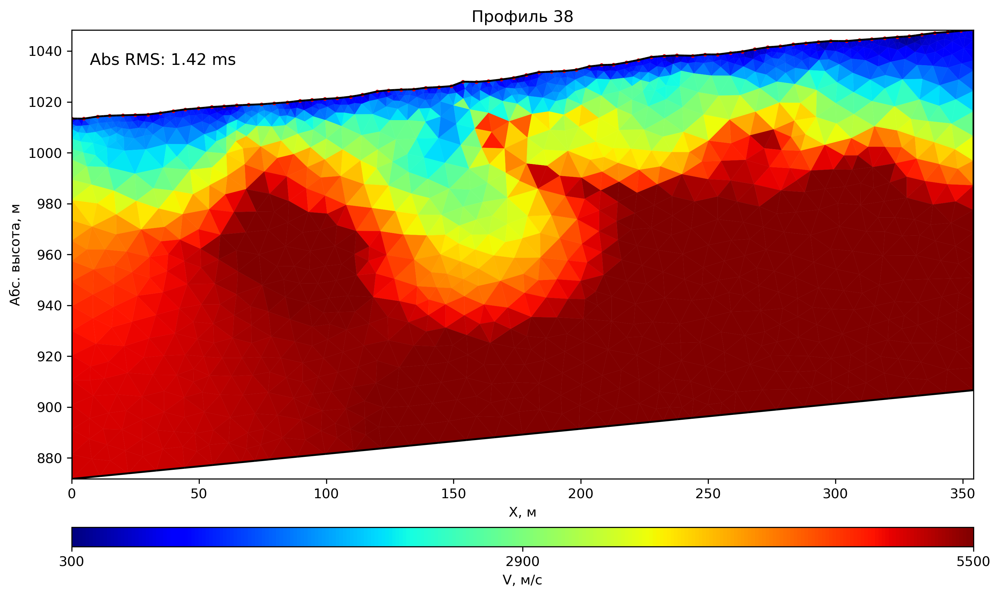

In [131]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet', colorBar=True,
               cMin=300, cMax=5500, 
               fitView=True, label='V, м/c',
               # coverage=mgr.standardizedCoverage(),
              )

ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Профиль 38")

plt.show()

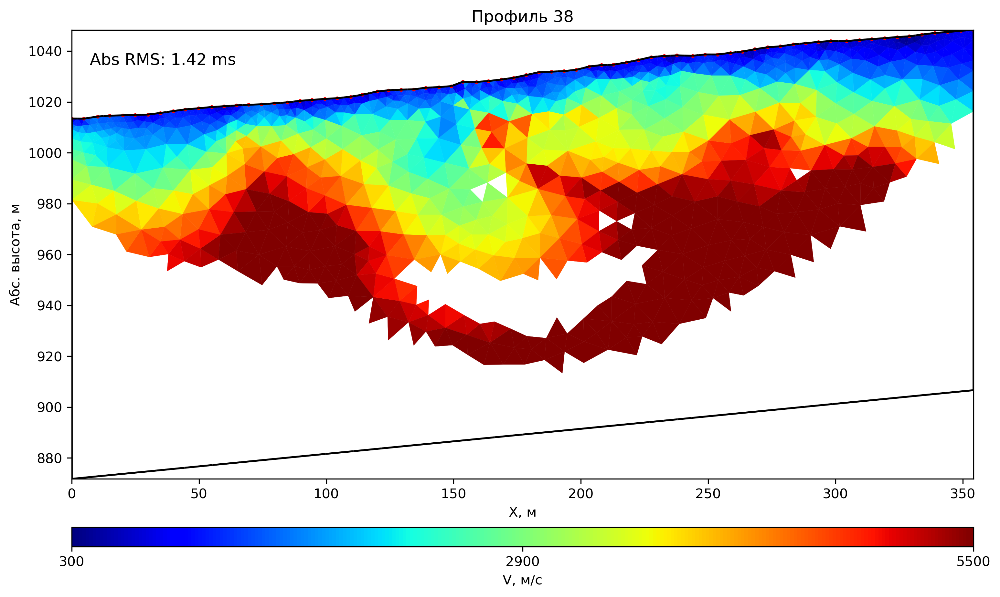

In [132]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet', colorBar=True,
               cMin=300, cMax=5500, 
               fitView=True, label='V, м/c',
               coverage=mgr.standardizedCoverage(),
              )

ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Профиль 38")

plt.show()

### Инверсия с ограничениями на скорость

In [133]:
# Обнновление менеджера
data.remove(data['t'] < 0)
mgr = tt.TravelTimeManager(data)
data['err'] = mgr.estimateError(data['t'], errLevel=0.03, absError=1e-9)


# Inversion
mgr.invert(secNodes=3, paraMaxCellSize=50.,
           zWeight=0.7, vTop=300, vBottom=7000,
           verbose=True, balanceDepth=False,
           lam=500, lambdaFactor = 0.5, dPhi = 2,
           limits = [500,5500]
          )

# Вычисление абсолютного значения корня средней квадратичной ошибки
abs_rms = mgr.inv.absrms()
abs_rms = abs_rms * 1000

23/10/24 - 13:55:17 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 13:55:17 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 13:55:17 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/24 - 13:55:17 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
23/10/24 - 13:55:17 - pyGIMLi - INFO - Create gradient starting model. 300: 7000
23/10/24 - 13:55:17 - pyGIMLi - INFO - Created startmodel from forward operator: 2257, min/max=0.000143/0.003333
23/10/24 - 13:55:17 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.TravelTimeDijkstraModelling object at 0x00000251B4035210>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000251B314F8D0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x000002514DEC9E00>
min/max (data): 1.2e-06/0.09
min/max (error): 3%/3.08%
min/max (start model): 1.4e-04/0.0033
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2609.07
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  221.03 (dPhi = 97.88%) lam: 500.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   83.24 (dPhi = 65.83%) lam: 250.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   31.82 (dPhi = 57.55%) lam: 125.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   2

#### Отображение результата со значением RMSE с ограничениями на скорость

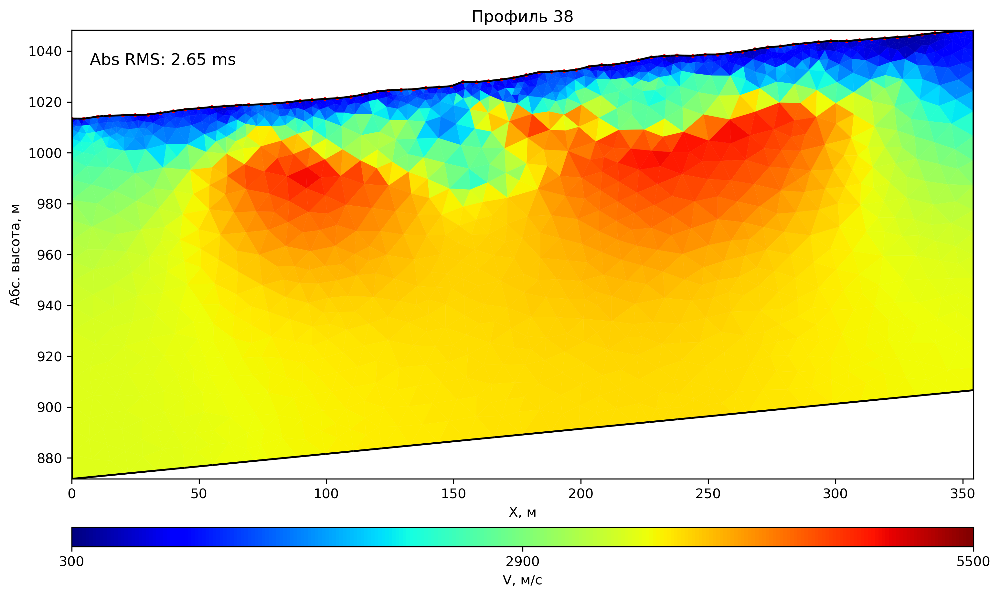

In [134]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet', colorBar=True,
               cMin=300, cMax=5500, 
               fitView=True, label='V, м/c',
               # coverage=mgr.standardizedCoverage(),
              )

ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Профиль 38")

plt.show()

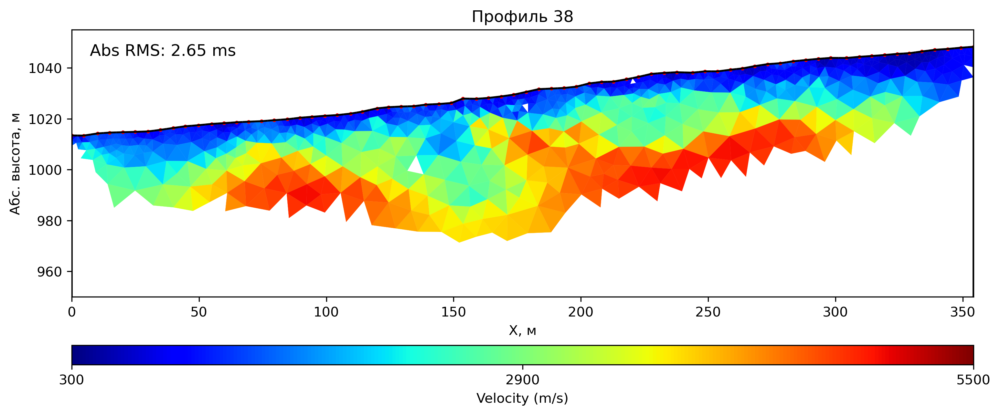

In [136]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet', 
               cMin=300, cMax=5500, 
               fitView=True,
               coverage=mgr.standardizedCoverage()
              )

ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_ylim([950, 1055])
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Профиль 38")

plt.show()

```{note}
**Вы можете поэкспериментировать с начальной моделью градиента (аргументы vTop и vBottom) и силой регуляризации lam.**
```

In [196]:
# Обнновление менеджера
data.remove(data['t'] < 0)
mgr = tt.TravelTimeManager(data)
data['err'] = mgr.estimateError(data['t'], errLevel=0.03, absError=1e-9)


# Inversion
mgr.invert(paraMaxCellSize=5.,
           zWeight=0.7, vTop=300, vBottom=7000,
           verbose=True, balanceDepth=False,
           lam=750, lambdaFactor = 0.75, dPhi = 2,
           limits = [500,5500],
          )

# Вычисление абсолютного значения корня средней квадратичной ошибки
abs_rms = mgr.inv.absrms()
abs_rms = abs_rms * 1000

25/10/24 - 14:11:03 - pyGIMLi - INFO - Found 1 regions.
25/10/24 - 14:11:04 - pyGIMLi - INFO - Found 1 regions.
25/10/24 - 14:11:04 - pyGIMLi - INFO - Creating forward mesh from region infos.
25/10/24 - 14:11:04 - pyGIMLi - INFO - Creating refined mesh (secnodes: 2) to solve forward task.
25/10/24 - 14:11:05 - pyGIMLi - INFO - Create gradient starting model. 300: 7000
25/10/24 - 14:11:05 - pyGIMLi - INFO - Created startmodel from forward operator: 16400, min/max=0.000143/0.003333
25/10/24 - 14:11:05 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.TravelTimeDijkstraModelling object at 0x000002513348A430>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000251B2E95850>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000251B1F7D2A0>
min/max (data): 1.2e-06/0.09
min/max (error): 3%/3.08%
min/max (start model): 1.4e-04/0.0033
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2756.35
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  368.88 (dPhi = 98.68%) lam: 750.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  259.45 (dPhi = 30.49%) lam: 562.5
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  118.17 (dPhi = 55.15%) lam: 421.9
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   8

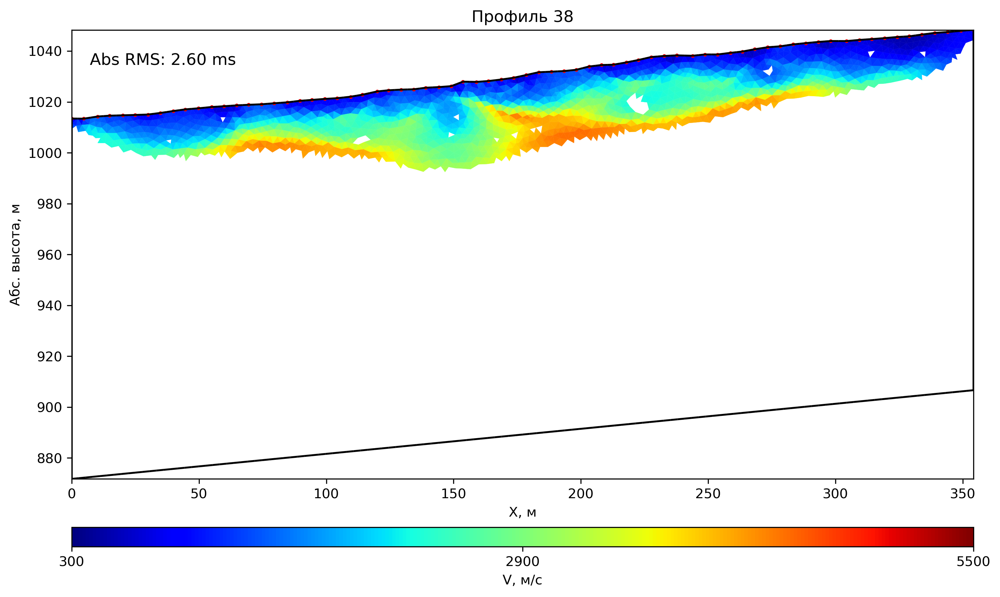

In [197]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet', colorBar=True,
               cMin=300, cMax=5500, 
               fitView=True, label='V, м/c',
               coverage=mgr.standardizedCoverage(),
              )

ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Профиль 38")

plt.show()

#### Отображение результата с трассировкой лучей со значением RMSE в заданных пределах 

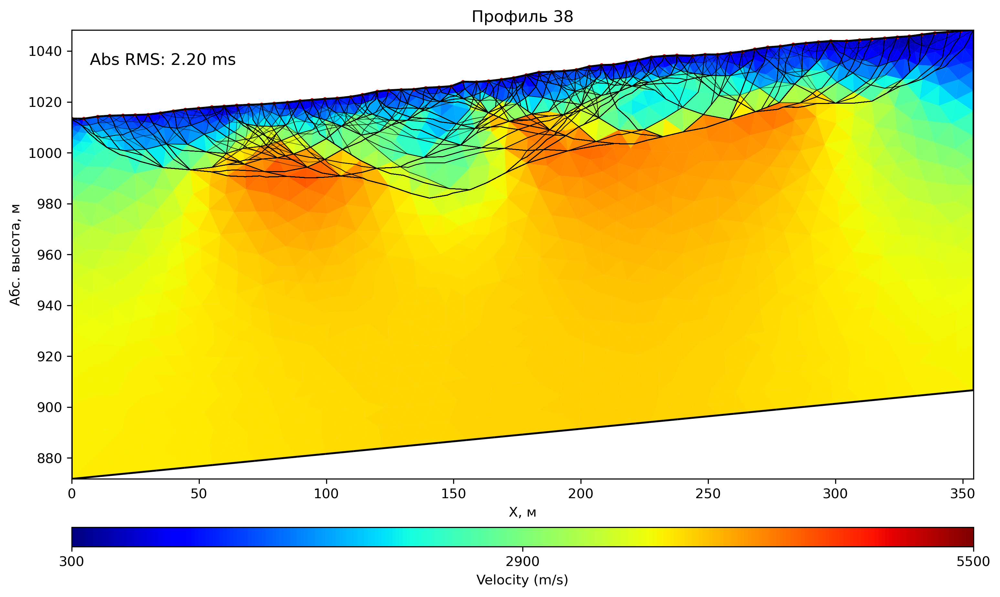

In [181]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet',
               cMin=300, cMax=5500, 
               # coverage=mgr.standardizedCoverage()
              )
               
ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
mgr.drawRayPaths(ax=ax, color="k", alpha=0.5, linewidth=0.5)
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
# ax.set_ylim([890, 1050])
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Профиль 38")

plt.show()

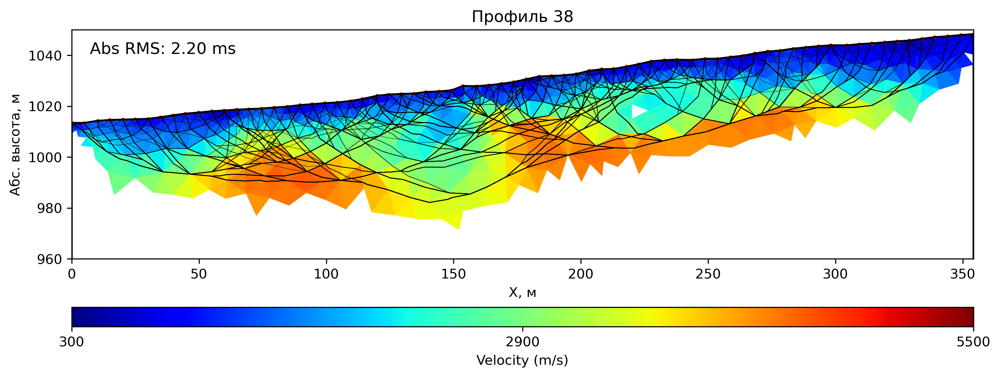

In [182]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet',
               cMin=300, cMax=5500, 
               coverage=mgr.standardizedCoverage()
              )
               
ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
mgr.drawRayPaths(ax=ax, color="k", alpha=0.5, linewidth=0.5)
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_ylim([960, 1050])
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Профиль 38")

plt.show()

### Маска. Плостность лучей.

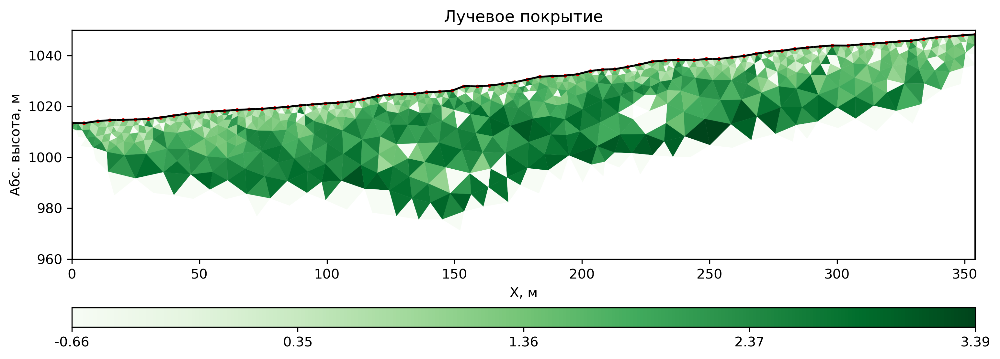

In [183]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showCoverage(ax=ax, cMap="Greens")
ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
ax.set_ylim([960, 1050])
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Лучевое покрытие")

plt.show()

## Установка регуляризации и параметры

### Инверсия с регуляризацией. Мера L1

```{note}
:class:

$$ w^* = \arg \min_{w} \sum_{j} ( t(x_{j}) -\sum_{i}w_{i}h_{i}(x_{j}))^2 + \lambda \sum_{i=1}^k |w_{i}| $$<br>





`Learn about`
[setRegularization](https://www.pygimli.org/pygimliapi/_generated/pygimli.frameworks.html#pygimli.frameworks.Inversion.setRegularization)
   - Go to the [code](https://www.pygimli.org/_modules/pygimli/frameworks/inversion.html#Inversion.setRegularization)!
```

In [161]:
# Обнновление менеджера
mgr = tt.TravelTimeManager(data)
data['err'] = mgr.estimateError(data['t'], errLevel=0.03, absError=1e-9)
data.remove(data['t'] < 0)

# Inversion
mgr.invert(paraMaxCellSize=50, zWeight=0.7, secNodes=3, 
           robustData=True,
           vTop=300, vBottom=7000, 
           lam=750, lambdaFactor = 0.75, dPhi = 2,
           limits=[500, 5500],
           verbose=True
          )

# Вычисление абсолютного значения корня средней квадратичной ошибки
abs_rms = mgr.inv.absrms()
abs_rms = abs_rms * 1000

23/10/24 - 14:15:22 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 14:15:22 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 14:15:22 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/24 - 14:15:22 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
23/10/24 - 14:15:22 - pyGIMLi - INFO - Create gradient starting model. 300: 7000
23/10/24 - 14:15:22 - pyGIMLi - INFO - Created startmodel from forward operator: 2472, min/max=0.000143/0.003333
23/10/24 - 14:15:22 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.TravelTimeDijkstraModelling object at 0x00000251B378FE70>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000251B378D530>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x000002514DEC8F20>
min/max (data): 1.2e-06/0.09
min/max (error): 1%/1.08%
min/max (start model): 1.4e-04/0.0033
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 32459.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1385.47 (dPhi = 95.40%) lam: 500.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  625.83 (dPhi = 42.77%) lam: 375.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  113.21 (dPhi = 68.69%) lam: 281.2
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   

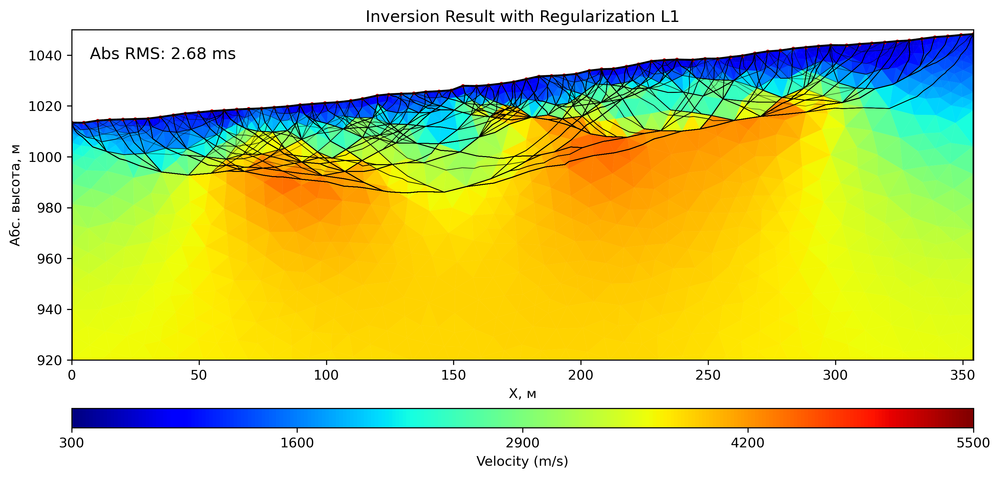

In [162]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)

mgr.showResult(ax=ax, logScale=False, cMap='jet',
               cMin=300, cMax=5500, fitView=True,
               # coverage=mgr.standardizedCoverage()
              )
mgr.drawRayPaths(ax=ax, color="k", alpha=0.5, linewidth=0.5)

ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_ylim([920, 1050])
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Inversion Result with Regularization L1")

plt.show()

### Инверсия с регуляризацией. Мера L2.

```{note}
:class:

$$ w^* = \arg \min_{w} \sum_{j} ( t(x_{j}) -\sum_{i}w_{i}h_{i}(x_{j}))^2 + \lambda \sum_{i=1}^k w_{i}^2 $$<br>





`Learn about`
[setRegularization](https://www.pygimli.org/pygimliapi/_generated/pygimli.frameworks.html#pygimli.frameworks.Inversion.setRegularization)
   - Go to the [code](https://www.pygimli.org/_modules/pygimli/frameworks/inversion.html#Inversion.setRegularization)!
```

In [163]:
# Обнновление менеджера
mgr = tt.TravelTimeManager(data)
data['err'] = mgr.estimateError(data['t'], errLevel=0.03, absError=1e-9)
data.remove(data['t'] < 0)

#устанавливает регуляризацию второго порядка с корреляционными длинами 20 (horizontal) и 5 (vertical).
mgr.inv.setRegularization(2, correlationLengths=[20, 5], dip = -25) 


# Inversion
mgr.invert(secNodes=3, paraMaxCellSize=50, zWeight=0.7,
           vTop=400, vBottom=7000, 
           lam=750, lambdaFactor = 0.75, dPhi = 2,
           limits=[500, 5500],
           verbose=True)

# Вычисление абсолютного значения корня средней квадратичной ошибки
abs_rms = mgr.inv.absrms()
abs_rms = abs_rms * 1000

23/10/24 - 14:18:51 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 14:18:51 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 14:18:51 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/24 - 14:18:51 - pyGIMLi - INFO - Creating refined mesh (secnodes: 3) to solve forward task.
23/10/24 - 14:18:51 - pyGIMLi - INFO - Create gradient starting model. 400: 7000
23/10/24 - 14:18:51 - pyGIMLi - INFO - Created startmodel from forward operator: 2472, min/max=0.000143/0.002500
23/10/24 - 14:18:51 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.TravelTimeDijkstraModelling object at 0x000002514507E160>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000251B37D7380>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000251B3B72490>
min/max (data): 1.2e-06/0.09
min/max (error): 3%/3.08%
min/max (start model): 1.4e-04/0.0025
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2320.39
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  270.20 (dPhi = 98.69%) lam: 750.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  151.45 (dPhi = 44.88%) lam: 562.5
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  101.57 (dPhi = 29.08%) lam: 421.9
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   7

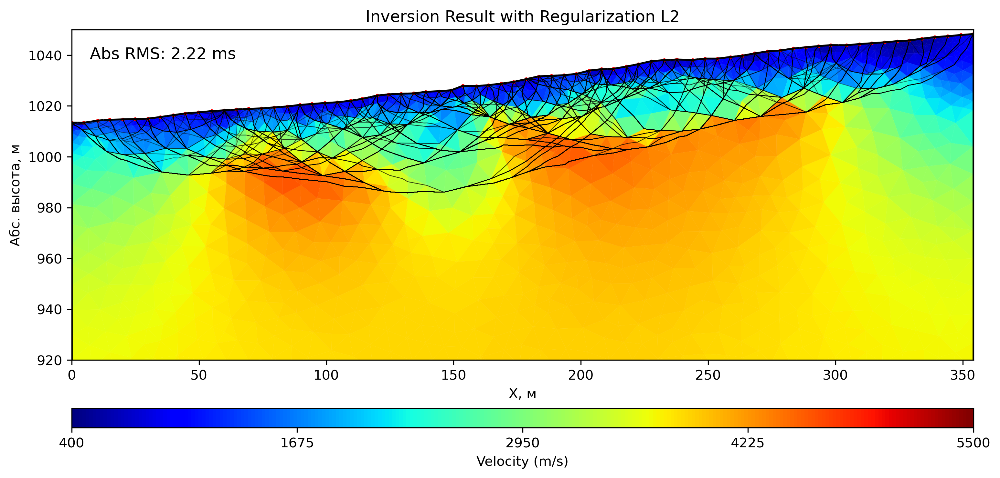

In [166]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)

mgr.showResult(ax=ax, logScale=False, cMap='jet',
               cMin=400, cMax=5500, 
               fitView=True,
               #coverage=mgr.standardizedCoverage()
              )
mgr.drawRayPaths(ax=ax, color="k", alpha=0.5, linewidth=0.5)

ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_ylim([920, 1050])
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Inversion Result with Regularization L2")

plt.show()

```{note}
:class: dropdown

- **regionNr $(int, [ints], '*')$** – _Номер региона, список номеров или "*" для всех._

- **startModel $(float)$** – _начальная модель._

- **limits $([float, float])$** – _нижний и верхний предел._

- **cType $(int)$** – _тип ограничения (регуляризации)_

- **zWeight $(float)$** – _относительный вес для вертикальных границ._

- **fix $(float)$** – _полностью исключить регион из инверсии (fix to value)._

- **correlationLengths $([floats])$** – _длины корреляции для геостатистической инверсии (x', y', z')._

- **dip $(float [0])$** – _угол между x и x' (первая длина корреляции)._

- **strike $(float [0])$** – _угол между y и y' (вторая длина корреляции)._

`Learn about`
[setRegularization](https://www.pygimli.org/pygimliapi/_generated/pygimli.frameworks.html#pygimli.frameworks.Inversion.setRegularization)
   - Go to the [code](https://www.pygimli.org/_modules/pygimli/frameworks/inversion.html#Inversion.setRegularization)!
```

## Инверсия с заданием границ модели

### Считывание файлов с выделенными аномалиями

In [167]:
xzs = [pd.read_csv(file, sep=', ', header=None, engine='python').values for file in glob.glob("p*.dat")]

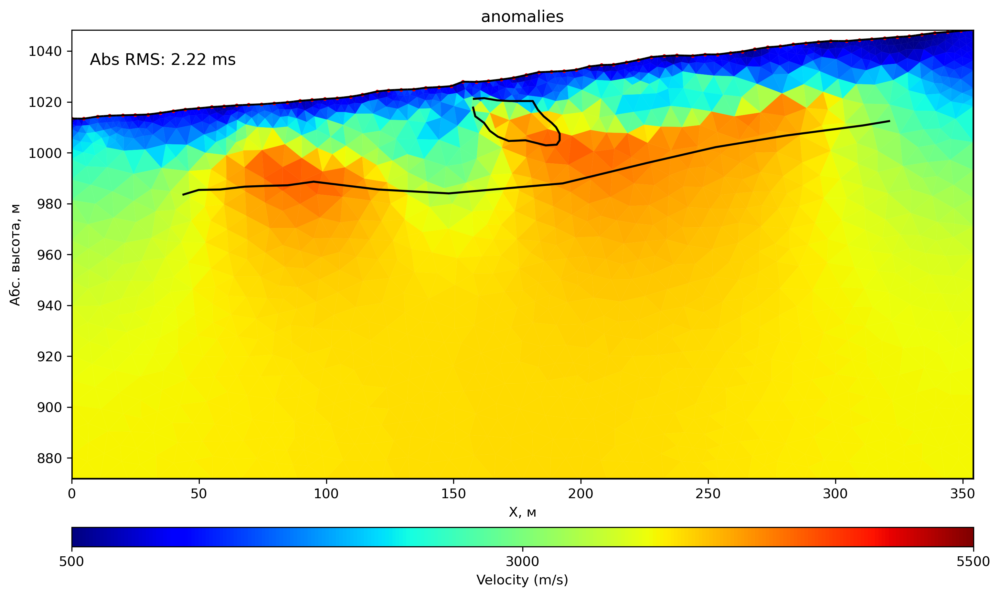

In [168]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet', 
               cMin=500, cMax=5500)
# mgr.drawRayPaths(ax=ax, color="k", alpha=0.5, linewidth=0.5)

ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
for xz in xzs:
    ax.plot(xz[:, 0], xz[:, 1], "k-")
#ax.set_ylim([110, 165])
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("anomalies")

plt.show()

(<Axes: >, <matplotlib.colorbar.Colorbar at 0x251b4a77110>)

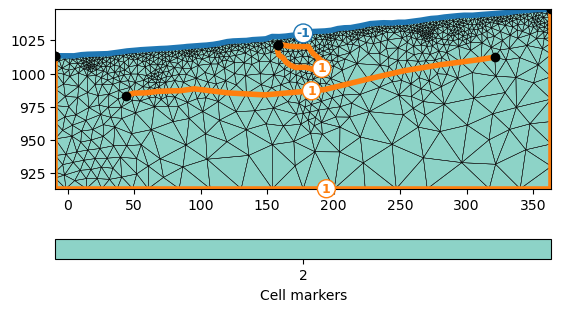

In [171]:
plc = mt.createParaMeshPLC(data, paraDepth=100, boundary=0)
line = mt.createPolygon(xzs[0], marker=1)
plc += line
line = mt.createPolygon(xzs[1], marker=2, isClosed=True)
plc += line
mesh2 = mt.createMesh(plc, quality=34.3)
pg.show(mesh2, markers=True, showMesh=True)

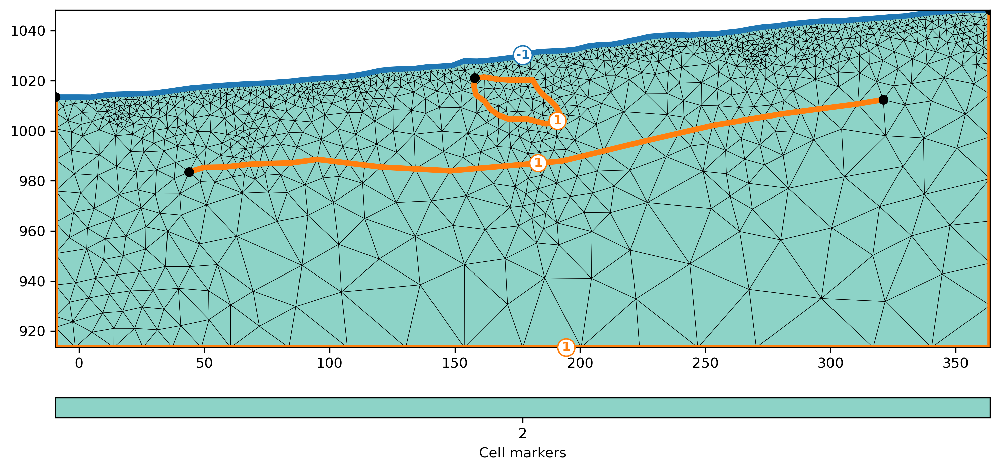

In [170]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)

plc = mt.createParaMeshPLC(data, paraDepth=100, boundary=0)
line = mt.createPolygon(xzs[0], marker=1, linewidth = 1)
plc += line
line = mt.createPolygon(xzs[1], marker=2, isClosed=True)
plc += line
mesh2 = mt.createMesh(plc, quality=34.3)
pg.show(mesh2, ax=ax, markers=True, showMesh=True)


plt.show()

In [172]:
# Обнновление менеджера
mgr = tt.TravelTimeManager(data)
data['err'] = mgr.estimateError(data['t'], errLevel=0.03, absError=1e-9)
data.remove(data['t'] < 0)

# Inversion
mgr.setMesh(mesh2)
mgr.invert(secNodes=3, paraMaxCellSize=50.,
           zWeight=0.7, vTop=400, vBottom=7000,
           verbose=True, 
           limits = [500,5500],
           lam=750, lambdaFactor = 0.75, dPhi = 2)

# Вычисление абсолютного значения корня средней квадратичной ошибки
abs_rms = mgr.inv.absrms()
abs_rms = abs_rms * 1000

23/10/24 - 14:27:42 - pyGIMLi - INFO - Found 1 regions.
23/10/24 - 14:27:42 - pyGIMLi - INFO - Creating forward mesh from region infos.
23/10/24 - 14:27:42 - pyGIMLi - INFO - Creating refined mesh (secnodes: 2) to solve forward task.
23/10/24 - 14:27:42 - pyGIMLi - INFO - Create gradient starting model. 400: 7000
23/10/24 - 14:27:42 - pyGIMLi - INFO - Created startmodel from forward operator: 2007, min/max=0.000143/0.002500
23/10/24 - 14:27:42 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.traveltime.modelling.TravelTimeDijkstraModelling object at 0x000002514DEB0E00>
Data transformation: <pgcore._pygimli_.RTrans object at 0x00000251B111D9E0>
Model transformation (cumulative):
	 0 <pgcore._pygimli_.RTransLogLU object at 0x00000251B21C92A0>
min/max (data): 1.2e-06/0.09
min/max (error): 3%/3.08%
min/max (start model): 1.4e-04/0.0025
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1470.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  222.66 (dPhi = 98.84%) lam: 750.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   73.17 (dPhi = 66.93%) lam: 562.5
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   41.54 (dPhi = 35.15%) lam: 421.9
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   2

#### Отображение результата инверсии

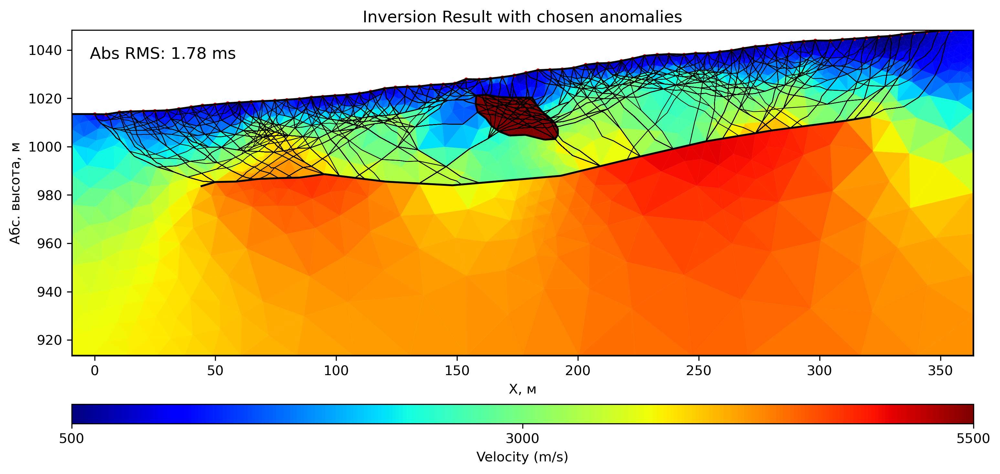

In [174]:
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)
mgr.showResult(ax=ax, logScale=False, nLevs=3, cMap='jet',
               cMin=500, cMax=5500)
ax.scatter(data.sensors()[:, 0], data.sensors()[:, 1], s=3, c='r')
mgr.drawRayPaths(ax=ax, color="k", alpha=1, linewidth=0.5)
ax.text(0.02, 0.95, f'Abs RMS: {abs_rms:.2f} ms', transform=ax.transAxes, fontsize=12, verticalalignment='top')
#ax.set_ylim([110, 165])
ax.set_xlabel("Х, м")
ax.set_ylabel("Абс. высота, м")
ax.set_title("Inversion Result with chosen anomalies")

plt.show()

#### Обновленные данные в виде годографов

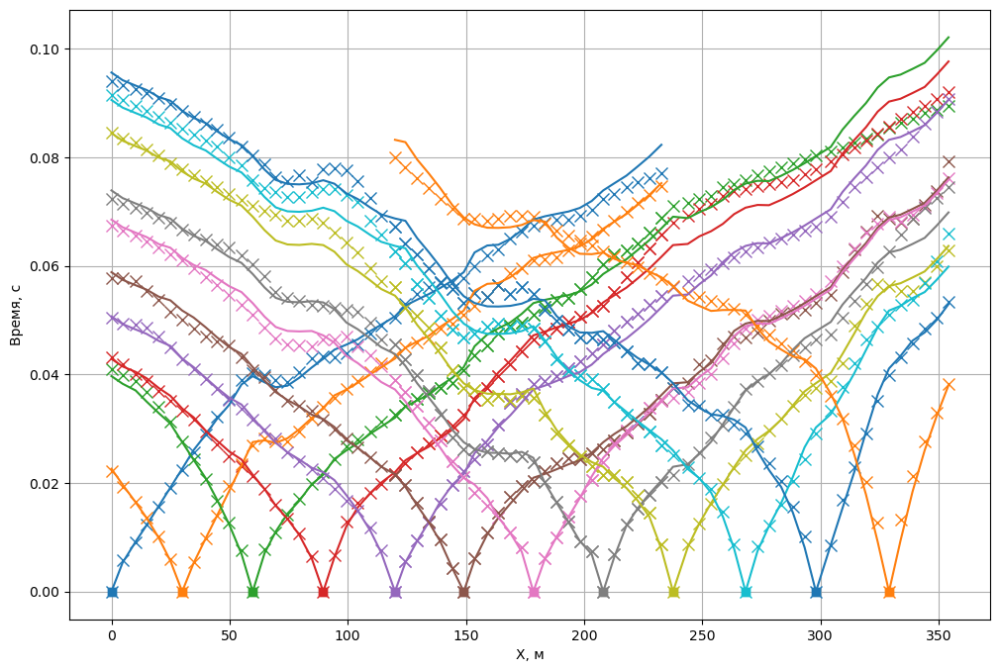

In [175]:
fig, ax = plt.subplots(figsize=(12, 8))
mgr.showFit(firstPicks=True, ax=ax)
ax.set_xlabel("Х, м")
ax.set_ylabel("Время, с")

plt.show()

# Сохранение

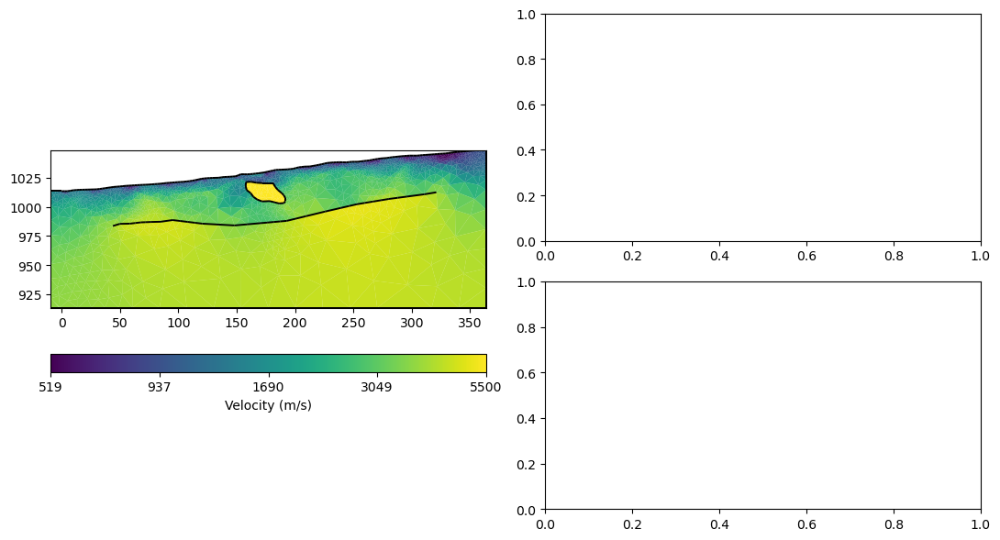

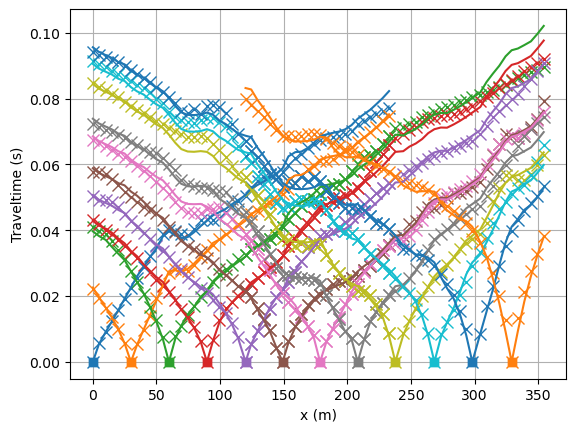

In [176]:
fig = mgr.showResultAndFit()

## Базовое

In [105]:
mgr.saveResult()

'.\\20240730-15.10\\TravelTimeManager'

In [53]:
mgr.rayCoverage()

1993 [7.294919696223675,...,0.0]

In [49]:
mgr.saveResult('foldersave', size=(12, 10))

Path foldersave\TravelTimeManager already exists. Skipping


'foldersave\\TravelTimeManager'

```{note}
:class: dropdown
            * Resulting inversion model
            * Velocity vector
            * Coverage vector
            * Standardized coverage vector
            * Mesh (bms and vtk with results)
`Learn about` [SaveResult](https://www.pygimli.org/pygimliapi/_generated/pygimli.physics.traveltime.html#pygimli.physics.traveltime.TravelTimeManager.saveResult)
   - Go to the [code](https://www.pygimli.org/_modules/pygimli/physics/traveltime/TravelTimeManager.html#TravelTimeManager.saveResult)!
```

## Экспорт результата модели в файл VTK

In [97]:
mgr.paraDomain.exportVTK('Test.vtk')

## Подгрузка экспорта и сохранение xyV

In [92]:
mesh_filename = 'foldersave/TravelTimeManager/velocity.vtk'
export_mesh_data(mesh_filename, "my_mesh_data.txt") 

# Функционал

In [71]:
dir(mgr)

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_data', '_debug', '_ensureData', '_ensureError', '_fop', '_fw', '_initForwardOperator', '_initInversionFramework', '_verbose', 'applyData', 'applyMesh', 'checkData', 'checkError', 'coverage', 'createArgParser', 'createForwardOperator', 'createInversionFramework', 'createMesh', 'createMeshMovedToMeshManager', 'createTraveltimefield', 'data', 'debug', 'drawRayPaths', 'errIsAbsolute', 'estimateError', 'figs', 'fop', 'frequency', 'fw', 'getRayPaths', 'inv', 'invert', 'load', 'mesh', 'model', 'paraDomain', 'paraModel', 'postRun', 'preRun', 'rayCoverage', 'reinitForwardOperator', 'saveResult', 'secNodes', 'setData', 'setMesh', 'showCove

In [22]:
print(dir(mgr.inv))

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_dataTrans', '_dataVals', '_debug', '_errorVals', '_fop', '_inv', '_keepStartModel', '_lam', '_model', '_postStep', '_preStep', '_startModel', '_stopAtChi1', '_verbose', 'absrms', 'axs', 'blockyModel', 'chi2', 'chi2History', 'convertStartModel', 'dataErrs', 'dataTrans', 'dataVals', 'debug', 'echoStatus', 'errorVals', 'fop', 'inv', 'isFrameWork', 'iter', 'lam', 'maxIter', 'minDPhi', 'model', 'modelHistory', 'modelTrans', 'phi', 'phiData', 'phiModel', 'relrms', 'reset', 'response', 'robustData', 'run', 'setConstraintWeights', 'setData', 'setDeltaChiStop', 'setDeltaPhiStop', 'setForwardOperator', 'setInterRegionConstraint', 'setInter